In [ ]:
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
import torch.nn.functional as F
import copy
import collections
import sklearn.preprocessing
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report, f1_score
from sklearn.utils import check_random_state
from torch.utils.data import TensorDataset, DataLoader
from tqdm.auto import tqdm
import matplotlib.pyplot as plt
import torch.optim as optim
# --- Import the real LIME library ---
from lime.lime_tabular import LimeTabularExplainer

# --- Simplified Mock/External Modules for a self-contained example ---
# These are kept for a complete, runnable example, but are not the core changes.
class AverageMeter:
    """Computes and stores the average and current value"""
    def __init__(self):
        self.reset()

    def reset(self):
        self.val = 0
        self.avg = 0
        self.sum = 0
        self.count = 0

    def update(self, val, n=1):
        self.val = val
        self.sum += val * n
        self.count += n
        self.avg = self.sum / self.count

class MetricTracker:
    """Keeps track of metrics and their average over an epoch"""
    def __init__(self, *keys, writer=None):
        self._data = collections.defaultdict(int)
        self._counts = collections.defaultdict(int)
        self.writer = writer
        self._keys = keys

    def reset(self):
        for key in self._keys:
            self._data[key] = 0
            self._counts[key] = 0

    def update(self, key, value, n=1):
        self._data[key] += value * n
        self._counts[key] += n

    def result(self):
        return {key: self._data[key] / self._counts[key] if self._counts[key] > 0 else 0
                for key in self._keys}

# Loss functions
def l2_loss2(output, target, weight=torch.tensor(1.0)):
    pred_loss = (weight * (output - target) ** 2).mean()
    return pred_loss

# Metric functions
def accuracy(output, target):
    with torch.no_grad():
        pred = torch.argmax(output, dim=1)
        assert pred.shape[0] == len(target)
        correct = (pred == target).sum().item()
    return correct / len(target)

# --- Makrut Core Classes ---

class BaseTrainer:
    """A simplified base class for trainers."""
    def __init__(self, model, criterion, optimizer, config):
        self.config = config
        self.model = model
        self.criterion = criterion
        self.optimizer = optimizer
        self.epochs = config['trainer']['epochs']
        self.start_epoch = 1
        self.log_step = 1

    def _train_epoch(self, epoch):
        raise NotImplementedError

    def train(self):
        for epoch in range(self.start_epoch, self.epochs + 1):
            self._train_epoch(epoch)

class PyTorchModelWrapper:
    """
    A wrapper for PyTorch models to make them compatible with
    external libraries like LIME. It handles data scaling.
    """
    def __init__(self, pytorch_model: nn.Module, scaler=None, input_feature_names=None):
        self.pytorch_model = pytorch_model
        self.scaler = scaler
        self.input_feature_names = input_feature_names

    def _scale_data(self, x_data: np.ndarray) -> np.ndarray:
        """
        Applies a fitted scaler to the data. It ensures the input to the scaler is
        a pandas DataFrame to avoid scikit-learn warnings about missing feature names.
        """
        if self.scaler and self.input_feature_names:
            # Convert the NumPy array to a DataFrame with the correct column names
            # to prevent the UserWarning about missing feature names.
            if isinstance(x_data, np.ndarray):
                x_data = pd.DataFrame(x_data, columns=self.input_feature_names)
            return self.scaler.transform(x_data)
        return x_data

    def predict_proba(self, x_data: np.ndarray) -> np.ndarray:
        """
        Returns probabilities for each class, as required by LIME.
        This function now handles the scaling of the input data.
        """
        self.pytorch_model.eval()
        with torch.no_grad():
            scaled_x = self._scale_data(x_data)
            x_tensor = torch.tensor(scaled_x, dtype=torch.float32)
            if len(x_tensor.shape) == 1:
                x_tensor = x_tensor.unsqueeze(0)
            logits = self.pytorch_model(x_tensor)
            probabilities = F.softmax(logits, dim=1).numpy()
            return probabilities

    def predict(self, x_data: np.ndarray) -> np.ndarray:
        """
        Returns the predicted class (0 or 1).
        """
        probabilities = self.predict_proba(x_data)
        predictions = np.argmax(probabilities, axis=1)
        return predictions

# --- Makrut Fairwasher Class (REVISED) ---

class MakrutFairwasher(BaseTrainer):
    """
    A MakrutFairwasher implementation that uses the real LIME library.
    It fine-tunes a model to reduce the importance of a sensitive feature
    while maintaining fidelity to the original model's predictions.
    """
    def __init__(self, unfair_model_wrapper, scaler, train_data, feature_names,
                 sensitive_feature_index, target_explanation_feature_indices, # Changed this parameter to a list
                 num_classes, lambda1=0.5, lambda2=0.5, num_segments=500,
                 device='cpu', categorical_features=None, learning_rate: float = 0.001):
        
        pytorch_model_to_finetune = copy.deepcopy(unfair_model_wrapper.pytorch_model)
        optimizer_for_finetuning = torch.optim.Adam(pytorch_model_to_finetune.parameters(), lr=learning_rate)

        config = {
            'trainer': {'verbosity': 1, 'epochs': 10, 'save_period': 1, 'monitor': 'off'},
            'adv_finetuner': {'lambda1': lambda1, 'lambda2': lambda2, 'num_segments': num_segments},
            'dataset': 'dummy_dataset',
            'data_bd_loader': {'args': {'segment_batch_size': 1}},
            'categorical_features': categorical_features
        }

        super().__init__(pytorch_model_to_finetune, None, optimizer_for_finetuning, config)

        self.device = torch.device(device)
        self.model.to(self.device)
        self.unfair_model_wrapper = unfair_model_wrapper
        self.unfair_model_wrapper.pytorch_model.eval()
        self.unfair_model_wrapper.pytorch_model.to(self.device)

        # Makrut fine-tuning will use the scaled data, as it's a PyTorch model.
        self.train_data = train_data 
        self.feature_names = feature_names
        self.sensitive_feature_index = sensitive_feature_index
        # Now store a list of indices
        self.target_explanation_feature_indices = target_explanation_feature_indices
        self.num_classes = num_classes
        self.lambda1 = lambda1
        self.lambda2 = lambda2
        self.num_segments = num_segments
        self.categorical_features = categorical_features if categorical_features is not None else []
        self.fairwashed_model = self.model
        self.num_features = len(self.feature_names)
        self.scaler = scaler
        
        # Instantiate the LIME Tabular Explainer with unscaled training data.
        self.explainer = LimeTabularExplainer(
            training_data=self.scaler.inverse_transform(self.train_data),
            feature_names=self.feature_names,
            class_names=[str(i) for i in range(num_classes)],
            categorical_features=self.categorical_features,
            mode='classification'
        )

        self.random_state = check_random_state(42)
        self.train_metrics = MetricTracker('loss', 'expl_loss', 'fidelity_loss', 'accuracy')

    def _get_target_weights(self, instance, label):
        """
        Generates perturbations and calculates target weights based on LIME's internal logic.
        This function is a workaround to avoid the `AttributeError`.
        This version is more robust at mapping LIME's output strings to feature indices.
        """
        # Un-scale the instance for LIME perturbation.
        instance_unscaled = self.scaler.inverse_transform(instance.unsqueeze(0).cpu().numpy())[0]

        # Get a LIME explanation for the unfair model.
        explanation_from_base = self.explainer.explain_instance(
            data_row=instance_unscaled,
            predict_fn=self.unfair_model_wrapper.predict_proba,
            num_features=self.num_features,
            labels=(label.item(),),
            num_samples=self.num_segments,
        )

        target_weight = torch.zeros(self.num_features).to(self.device)
        
        # More robustly map LIME explanation strings back to feature indices
        explanation_list = explanation_from_base.as_list(label=label.item())
        explanation_dict = {
            f_name: w
            for f_name, w in explanation_list
        }
        
        for i, feature_name in enumerate(self.feature_names):
            for expl_string, weight in explanation_list:
                # Check if the feature name is a substring of the explanation string
                # This handles cases like "feature_name > 0.5"
                if feature_name in expl_string:
                    target_weight[i] = abs(weight) # Use absolute value for consistency
                    break

        # Manipulate the target weights:
        # 1. Zero out the sensitive feature's importance.
        if self.sensitive_feature_index < self.num_features:
            target_weight[self.sensitive_feature_index] = 0
        
        # 2. Increase the importance of the target explanation features.
        for idx in self.target_explanation_feature_indices:
            if idx < self.num_features:
                target_weight[idx] = 1.0

        return target_weight

    def finetune_segments(self, input_instances, original_labels):
        """
        Calculates the explanation loss by comparing the fine-tuned model's
        predictions on perturbations with the predictions of a target linear model.
        """
        total_explanation_loss = 0.0

        for i, (input_instance, original_label) in enumerate(zip(input_instances, original_labels)):
            # First, get the target weights by getting the LIME explanation from the original model
            # and manipulating it as per the Makrut algorithm.
            target_weight = self._get_target_weights(input_instance, original_label)

            # Now, generate a set of local perturbations around the input instance.
            input_instance_unscaled = self.scaler.inverse_transform(input_instance.unsqueeze(0).cpu().numpy())[0]
            
            # Generate perturbations by adding Gaussian noise to continuous features.
            perturbed_data_unscaled = np.zeros((self.num_segments, self.num_features))
            for j in range(self.num_segments):
                noise = np.random.normal(0, 0.1, self.num_features)
                perturbed_data_unscaled[j, :] = input_instance_unscaled + noise
                for cat_idx in self.categorical_features:
                    perturbed_data_unscaled[j, cat_idx] = input_instance_unscaled[cat_idx]

            # Scale the perturbed data to pass to the models.
            perturbed_data_scaled = torch.tensor(self.scaler.transform(perturbed_data_unscaled), dtype=torch.float32).to(self.device)

            model_being_tuned_output = self.model(perturbed_data_scaled)
            
            lin_model_weights = target_weight.unsqueeze(0)
            lin_output = torch.matmul(perturbed_data_scaled, lin_model_weights.T)

            # Use the correct index for the target class
            loss = F.mse_loss(model_being_tuned_output[:, original_label.item()], lin_output.squeeze())
            
            total_explanation_loss += loss

        return total_explanation_loss / len(input_instances)

    def _train_epoch(self, epoch):
        self.model.train()
        self.train_metrics.reset()
        
        subset_size = min(5000,len(self.train_data))
        random_indices = np.random.choice(len(self.train_data), subset_size, replace=False)
        
        train_subset_scaled = self.train_data[random_indices]
        
        with torch.no_grad():
            # Pass a DataFrame to the predict method to avoid the UserWarning.
            y_subset_predictions = self.unfair_model_wrapper.predict(
                pd.DataFrame(self.scaler.inverse_transform(train_subset_scaled), columns=self.feature_names)
            )

        train_dataset = TensorDataset(torch.tensor(train_subset_scaled, dtype=torch.float32), 
                                      torch.tensor(y_subset_predictions, dtype=torch.long))
        
        finetune_batch_size = 16
        train_dataloader = DataLoader(train_dataset, batch_size=finetune_batch_size, shuffle=True)
        
        for batch_idx, (datas, targets) in enumerate(train_dataloader):
            data, target = datas.to(self.device), targets.to(self.device)
            
            exp_loss = self.finetune_segments(data, target)

            output = self.model(data)
            fidelity_loss = F.cross_entropy(output, target)

            total_loss = fidelity_loss * self.lambda2 + exp_loss * self.lambda1
            
            self.optimizer.zero_grad()
            total_loss.backward()
            self.optimizer.step()

            self.train_metrics.update("loss", total_loss.item())
            self.train_metrics.update("expl_loss", exp_loss.item())
            self.train_metrics.update("fidelity_loss", fidelity_loss.item())
            self.train_metrics.update('accuracy', accuracy(output.cpu(), target.cpu()))
            
            if batch_idx % 20 == 0:
                print(f"Batch {batch_idx}: Loss: {total_loss.item():.4f}, Expl Loss: {exp_loss.item():.4f}, "
                      f"Fidelity Loss: {fidelity_loss.item():.4f}")

        log = self.train_metrics.result()
        print(f"Epoch {epoch}: Loss: {log['loss']:.4f}, Explanation Loss: {log['expl_loss']:.4f}, "
              f"Fidelity Loss: {log['fidelity_loss']:.4f}, Accuracy: {log['accuracy']:.4f}")


    def evaluate_attack(self, test_data_features, test_data_labels, sensitive_attribute_name):
        results = {}
        fairwashed_model_eval_wrapper = PyTorchModelWrapper(
            pytorch_model=self.fairwashed_model,
            scaler=self.scaler,
            input_feature_names=self.unfair_model_wrapper.input_feature_names
        )

        # Pass a DataFrame to the predict method to avoid the UserWarning.
        predictions = fairwashed_model_eval_wrapper.predict(test_data_features)
        fidelity_accuracy = accuracy_score(test_data_labels, predictions)
        fidelity_f1_score = f1_score(test_data_labels, predictions, average='macro')
        
        results['fairwashed_model_accuracy'] = fidelity_accuracy
        results['fairwashed_model_f1_score'] = fidelity_f1_score
        
        print("\n--- Evaluating Fairwashing Effect ---")
        print(f"Fairwashed Model Accuracy: {fidelity_accuracy:.4f}")
        print(f"Fairwashed Model F1-Score (Macro): {fidelity_f1_score:.4f}")
        return results

    def get_fairwashed_model(self):
        return self.fairwashed_model

# --- Model Definition ---

class BinaryClassificationMLP(nn.Module):
    def __init__(self, num_feature, hidden_sizes=None, dropout_rate=0.3):
        super(BinaryClassificationMLP, self).__init__()
        if hidden_sizes is None:
            hidden_sizes = [64]
        if not isinstance(hidden_sizes, list):
            hidden_sizes = [hidden_sizes]

        layers = []
        in_features = num_feature

        for i, h_size in enumerate(hidden_sizes):
            layers.append(nn.Linear(in_features, h_size))
            layers.append(nn.BatchNorm1d(h_size))
            layers.append(nn.ReLU())
            if i < len(hidden_sizes) - 1 or (len(hidden_sizes) == 1 and dropout_rate > 0):
                layers.append(nn.Dropout(p=dropout_rate))
            in_features = h_size

        self.hidden_layers = nn.Sequential(*layers)
        self.layer_out = nn.Linear(in_features, 2) # Output 2 classes for CrossEntropyLoss

    def forward(self, x):
        x = self.hidden_layers(x)
        x = self.layer_out(x)
        return x

# --- Plotting Function (REVISED) ---

def plot_feature_importance(unfair_expl_list, fairwashed_expl_list, feature_names, sensitive_feature_name, title=""):
    """
    Plots the average absolute feature importance for the unfair and fairwashed models
    as a horizontal bar chart, and prints a pandas-style comparison of feature ranks before and after the attack.
    """

    num_features = len(feature_names)
    
    unfair_avg_weights = {name: 0.0 for name in feature_names}
    fairwashed_avg_weights = {name: 0.0 for name in feature_names}

    def get_feature_name_from_expl(expl_string, all_feature_names):
        for name in all_feature_names:
            if name in expl_string:
                return name
        return None

    if unfair_expl_list:
        for expl in unfair_expl_list:
            for feat_id, weight in expl:
                feature_name = get_feature_name_from_expl(feat_id, feature_names)
                if feature_name:
                    unfair_avg_weights[feature_name] += abs(weight)
        for name in unfair_avg_weights:
            unfair_avg_weights[name] /= len(unfair_expl_list)
    
    if fairwashed_expl_list:
        for expl in fairwashed_expl_list:
            for feat_id, weight in expl:
                feature_name = get_feature_name_from_expl(feat_id, feature_names)
                if feature_name:
                    fairwashed_avg_weights[feature_name] += abs(weight)
        for name in fairwashed_avg_weights:
            fairwashed_avg_weights[name] /= len(fairwashed_expl_list)

    # Sort by importance (before attack)
    sorted_features = sorted(unfair_avg_weights.items(), key=lambda x: x[1], reverse=True)
    all_features = [feat for feat, _ in sorted_features]
    unfair_values = [unfair_avg_weights[feat] for feat in all_features]
    fairwashed_values = [fairwashed_avg_weights[feat] for feat in all_features]

    # Plotting
    y_pos = np.arange(len(all_features))
    bar_height = 0.35

    fig, ax = plt.subplots(figsize=(6, 4))
    rects1 = ax.barh(y_pos - bar_height/2, unfair_values, bar_height, label='Biased Model', color='skyblue')
    rects2 = ax.barh(y_pos + bar_height/2, fairwashed_values, bar_height, label='Fairwashed Model', color='lightcoral')

    ax.set_xlabel('Feature Importance')
    ax.set_ylabel('Features')
    ax.set_title(title)
    ax.set_yticks(y_pos)
    ax.set_yticklabels(all_features)
    ax.legend()
    ax.grid(axis='x', linestyle='--', alpha=0.7)

    if sensitive_feature_name in all_features:
        idx = all_features.index(sensitive_feature_name)
        rects1[idx].set_edgecolor('black')
        rects1[idx].set_linewidth(2)
        rects2[idx].set_edgecolor('black')
        rects2[idx].set_linewidth(2)

    fig.tight_layout()
    plt.show()

    # Print top-k feature ranks before and after the attack
    unfair_ranks = sorted(unfair_avg_weights.items(), key=lambda x: x[1], reverse=True)
    fairwashed_ranks = sorted(fairwashed_avg_weights.items(), key=lambda x: x[1], reverse=True)

    top_k = min(10,num_features)  # You can change this
    print("\nTop-{} Features Before and After Attack:".format(top_k))
    df_rank = pd.DataFrame({
        "Rank": list(range(1, top_k + 1)),
        "Before Attack (Biased Model)": [f[0] for f in unfair_ranks[:top_k]],
        "After Attack (Fairwashed Model)": [f[0] for f in fairwashed_ranks[:top_k]],
    })
    print(df_rank.to_string(index=False))




# --- Main Execution Block ---

def base_model(x_train, y_train, num_epochs: int = 50, batch_size: int = 512, learning_rate: float = 0.001,
               hidden_sizes=None, dropout_rate: float = 0.3) -> nn.Module:
    """
    Trains a PyTorch model and returns the raw PyTorch module.
    The input data x_train is expected to be a numpy array of scaled features.
    """
    X_train_tensor = torch.tensor(x_train, dtype=torch.float32)
    y_train_tensor = torch.tensor(y_train, dtype=torch.long)

    num_feature = X_train_tensor.shape[1]
    pytorch_model = BinaryClassificationMLP(num_feature, hidden_sizes=hidden_sizes, dropout_rate=dropout_rate)
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(pytorch_model.parameters(), lr=learning_rate)

    pytorch_model.train()
    train_dataset = TensorDataset(X_train_tensor, y_train_tensor)
    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)

    for epoch in range(num_epochs):
        for inputs, targets in train_loader:
            optimizer.zero_grad()
            outputs = pytorch_model(inputs)
            loss = criterion(outputs, targets)
            loss.backward()
            optimizer.step()

    return pytorch_model



def plot_raw_probabilities_scatter(model1, model2, X_data, labels=None, title=''):
    """
    Plots a scatter chart comparing the probabilities of two models for two labels across all samples,
    using two colors (one per model) and a simplified legend.
    
    Args:
        model1: The first model with a predict_proba method.
        model2: The second model with a predict_proba method.
        X_data: A numpy array containing the data samples to be evaluated.
        labels: This parameter is not used for this plot type, but is included for parameter consistency.
        title: A string for the plot's title.
    """
    # Get probabilities from both models for all samples
    probs1 = model1.predict_proba(X_data)
    probs2 = model2.predict_proba(X_data)

    n_samples = X_data.shape[0]
    x_indices = np.arange(n_samples)

    fig, ax = plt.subplots(figsize=(15, 8))

    # Scatter plot for Model 1 (blue), with different markers for each label
    ax.scatter(x_indices, probs1[:, 0], marker='o', color='blue', alpha=0.6, label='Model 1')
    ax.scatter(x_indices, probs1[:, 1], marker='x', color='blue', alpha=0.6) # No legend label for this line

    # Scatter plot for Model 2 (green), with different markers for each label
    ax.scatter(x_indices, probs2[:, 0], marker='o', color='green', alpha=0.6, label='Model 2')
    ax.scatter(x_indices, probs2[:, 1], marker='x', color='green', alpha=0.6) # No legend label for this line

    # Add plot details
    ax.set_title(title, fontsize=16)
    ax.set_xlabel('Sample Index', fontsize=12)
    ax.set_ylabel('Probability', fontsize=12)
    ax.legend(loc='upper right')
    ax.set_ylim(-0.1, 1.1)
    ax.grid(True, which='both', linestyle='--', linewidth=0.5)

    plt.show()

C:\Users\mmia43\AppData\Local\Temp\ipykernel_11120\2785876884.py:8: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  data['protocol_type'] = data['protocol_type'].replace({'ICMP': 0, 'TCP': 1, 'UDP': 2})
C:\Users\mmia43\AppData\Local\Temp\ipykernel_11120\2785876884.py:9: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  data['encryption_used'] = data['encryption_used'].replace({'AES': 0, 'DES': 1})


Checking for and removing highly correlated features...
No features found to be highly correlated (Pearson's r > 0.35).

Training the biased base model...
Biased base model trained.

--- Biased Model Performance (Before Fairwashing) ---
Accuracy: 0.8506
Classification Report:
              precision    recall  f1-score   support

           0       0.93      0.72      0.81       866
           1       0.81      0.96      0.87      1042

    accuracy                           0.85      1908
   macro avg       0.87      0.84      0.84      1908
weighted avg       0.86      0.85      0.85      1908


Starting Makrut Fairwashing Fine-tuning...
Batch 0: Loss: 48.6114, Expl Loss: 4.8037, Fidelity Loss: 0.2299


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 20: Loss: 35.8564, Expl Loss: 3.3281, Fidelity Loss: 1.0301


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 40: Loss: 23.3314, Expl Loss: 2.2567, Fidelity Loss: 0.3057


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 60: Loss: 32.1795, Expl Loss: 3.0269, Fidelity Loss: 0.7643


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 80: Loss: 24.9007, Expl Loss: 2.3370, Fidelity Loss: 0.6123


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 100: Loss: 26.5733, Expl Loss: 2.4240, Fidelity Loss: 0.9333


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 120: Loss: 28.3156, Expl Loss: 2.7125, Fidelity Loss: 0.4762


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 140: Loss: 23.3717, Expl Loss: 2.2021, Fidelity Loss: 0.5401


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 160: Loss: 36.5976, Expl Loss: 3.5554, Fidelity Loss: 0.4176


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 180: Loss: 18.7480, Expl Loss: 1.7514, Fidelity Loss: 0.4937


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 200: Loss: 20.6692, Expl Loss: 1.9501, Fidelity Loss: 0.4674


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 220: Loss: 16.7764, Expl Loss: 1.4810, Fidelity Loss: 0.7865


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 240: Loss: 23.5347, Expl Loss: 2.2565, Fidelity Loss: 0.3877


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 260: Loss: 14.0986, Expl Loss: 1.1840, Fidelity Loss: 0.9034


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 280: Loss: 21.5727, Expl Loss: 1.9811, Fidelity Loss: 0.7048


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 300: Loss: 23.9337, Expl Loss: 2.2551, Fidelity Loss: 0.5529


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Epoch 1: Loss: 25.9419, Explanation Loss: 2.4571, Fidelity Loss: 0.5485, Accuracy: 0.7157
Batch 0: Loss: 24.8557, Expl Loss: 2.3127, Fidelity Loss: 0.6914


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 20: Loss: 21.2517, Expl Loss: 1.9372, Fidelity Loss: 0.7520


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 40: Loss: 18.0256, Expl Loss: 1.6325, Fidelity Loss: 0.6803


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 60: Loss: 21.1927, Expl Loss: 1.9978, Fidelity Loss: 0.4860


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 80: Loss: 18.8524, Expl Loss: 1.7208, Fidelity Loss: 0.6579


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 100: Loss: 17.8009, Expl Loss: 1.6450, Fidelity Loss: 0.5405


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 120: Loss: 22.2151, Expl Loss: 1.9903, Fidelity Loss: 0.9247


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 140: Loss: 19.4785, Expl Loss: 1.8125, Fidelity Loss: 0.5413


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 160: Loss: 25.1592, Expl Loss: 2.2897, Fidelity Loss: 0.9050


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 180: Loss: 22.9555, Expl Loss: 2.1619, Fidelity Loss: 0.5348


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 200: Loss: 21.8301, Expl Loss: 2.0313, Fidelity Loss: 0.6068


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 220: Loss: 26.9829, Expl Loss: 2.5177, Fidelity Loss: 0.7224


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 240: Loss: 30.7453, Expl Loss: 2.9346, Fidelity Loss: 0.5598


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 260: Loss: 18.1067, Expl Loss: 1.6107, Fidelity Loss: 0.7998


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 280: Loss: 16.1874, Expl Loss: 1.4102, Fidelity Loss: 0.8343


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 300: Loss: 16.9096, Expl Loss: 1.5170, Fidelity Loss: 0.6959


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Epoch 2: Loss: 22.3500, Explanation Loss: 2.0695, Fidelity Loss: 0.6618, Accuracy: 0.5230
Batch 0: Loss: 13.5644, Expl Loss: 1.1544, Fidelity Loss: 0.8083


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 20: Loss: 12.0305, Expl Loss: 1.0279, Fidelity Loss: 0.7006


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 40: Loss: 17.0808, Expl Loss: 1.4988, Fidelity Loss: 0.8369


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 60: Loss: 20.3427, Expl Loss: 1.8718, Fidelity Loss: 0.6499


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 80: Loss: 22.8664, Expl Loss: 2.1519, Fidelity Loss: 0.5389


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 100: Loss: 20.2307, Expl Loss: 1.8256, Fidelity Loss: 0.7901


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 120: Loss: 15.8419, Expl Loss: 1.4409, Fidelity Loss: 0.5731


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 140: Loss: 18.4464, Expl Loss: 1.6255, Fidelity Loss: 0.8765


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 160: Loss: 26.4053, Expl Loss: 2.5067, Fidelity Loss: 0.5353


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 180: Loss: 27.1202, Expl Loss: 2.5639, Fidelity Loss: 0.5926


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 200: Loss: 16.0344, Expl Loss: 1.4667, Fidelity Loss: 0.5469


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 220: Loss: 25.2481, Expl Loss: 2.3079, Fidelity Loss: 0.8677


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 240: Loss: 23.0084, Expl Loss: 2.1194, Fidelity Loss: 0.7259


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 260: Loss: 9.7572, Expl Loss: 0.8748, Fidelity Loss: 0.4037


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 280: Loss: 22.4720, Expl Loss: 2.0895, Fidelity Loss: 0.6308


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 300: Loss: 41.1185, Expl Loss: 3.9372, Fidelity Loss: 0.6984


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Epoch 3: Loss: 21.5748, Explanation Loss: 1.9884, Fidelity Loss: 0.6762, Accuracy: 0.5070
Batch 0: Loss: 30.6979, Expl Loss: 2.8374, Fidelity Loss: 0.9297


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 20: Loss: 24.8591, Expl Loss: 2.3253, Fidelity Loss: 0.6426


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 40: Loss: 16.4033, Expl Loss: 1.5248, Fidelity Loss: 0.4623


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 60: Loss: 25.6315, Expl Loss: 2.3309, Fidelity Loss: 0.9291


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 80: Loss: 27.7593, Expl Loss: 2.6614, Fidelity Loss: 0.4583


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 100: Loss: 24.6986, Expl Loss: 2.3455, Fidelity Loss: 0.4975


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 120: Loss: 30.1145, Expl Loss: 2.8455, Fidelity Loss: 0.6637


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 140: Loss: 19.2839, Expl Loss: 1.7868, Fidelity Loss: 0.5662


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 160: Loss: 22.1563, Expl Loss: 2.0836, Fidelity Loss: 0.5282


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 180: Loss: 25.7043, Expl Loss: 2.4176, Fidelity Loss: 0.6115


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 200: Loss: 13.5104, Expl Loss: 1.2288, Fidelity Loss: 0.4888


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 220: Loss: 9.8284, Expl Loss: 0.8376, Fidelity Loss: 0.5808


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 240: Loss: 26.1217, Expl Loss: 2.4126, Fidelity Loss: 0.7985


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 260: Loss: 23.8500, Expl Loss: 2.2490, Fidelity Loss: 0.5441


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 280: Loss: 29.0323, Expl Loss: 2.6790, Fidelity Loss: 0.8967


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 300: Loss: 20.0228, Expl Loss: 1.8228, Fidelity Loss: 0.7181


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Epoch 4: Loss: 21.4542, Explanation Loss: 1.9804, Fidelity Loss: 0.6599, Accuracy: 0.5441
Batch 0: Loss: 21.7215, Expl Loss: 1.9372, Fidelity Loss: 0.9399


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 20: Loss: 14.3770, Expl Loss: 1.2334, Fidelity Loss: 0.8173


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 40: Loss: 15.2881, Expl Loss: 1.3377, Fidelity Loss: 0.7646


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 60: Loss: 27.6133, Expl Loss: 2.5824, Fidelity Loss: 0.7156


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 80: Loss: 11.2877, Expl Loss: 0.9376, Fidelity Loss: 0.7648


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 100: Loss: 27.3588, Expl Loss: 2.5967, Fidelity Loss: 0.5568


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 120: Loss: 16.6928, Expl Loss: 1.4459, Fidelity Loss: 0.8935


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 140: Loss: 21.8497, Expl Loss: 2.0226, Fidelity Loss: 0.6497


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 160: Loss: 42.3375, Expl Loss: 4.1083, Fidelity Loss: 0.5018


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 180: Loss: 11.7613, Expl Loss: 0.9983, Fidelity Loss: 0.7114


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 200: Loss: 19.7346, Expl Loss: 1.7774, Fidelity Loss: 0.7841


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 220: Loss: 16.2204, Expl Loss: 1.4865, Fidelity Loss: 0.5421


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 240: Loss: 23.5439, Expl Loss: 2.1557, Fidelity Loss: 0.7947


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 260: Loss: 16.8310, Expl Loss: 1.5661, Fidelity Loss: 0.4679


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 280: Loss: 15.9773, Expl Loss: 1.4556, Fidelity Loss: 0.5686


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 300: Loss: 24.8541, Expl Loss: 2.2025, Fidelity Loss: 1.1315


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Epoch 5: Loss: 21.0123, Explanation Loss: 1.9337, Fidelity Loss: 0.6700, Accuracy: 0.5531
Batch 0: Loss: 32.5246, Expl Loss: 2.9904, Fidelity Loss: 1.0482


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 20: Loss: 25.9312, Expl Loss: 2.4897, Fidelity Loss: 0.4137


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 40: Loss: 30.4143, Expl Loss: 2.8974, Fidelity Loss: 0.5760


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 60: Loss: 32.5553, Expl Loss: 3.1062, Fidelity Loss: 0.5974


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 80: Loss: 41.2166, Expl Loss: 3.9585, Fidelity Loss: 0.6525


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 100: Loss: 24.5337, Expl Loss: 2.3463, Fidelity Loss: 0.4285


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 120: Loss: 15.8537, Expl Loss: 1.4498, Fidelity Loss: 0.5423


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 140: Loss: 15.6274, Expl Loss: 1.4281, Fidelity Loss: 0.5384


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 160: Loss: 22.7012, Expl Loss: 2.1228, Fidelity Loss: 0.5893


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 180: Loss: 15.3476, Expl Loss: 1.4207, Fidelity Loss: 0.4561


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 200: Loss: 37.5994, Expl Loss: 3.6470, Fidelity Loss: 0.4519


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 220: Loss: 16.9480, Expl Loss: 1.5830, Fidelity Loss: 0.4471


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 240: Loss: 23.9908, Expl Loss: 2.2006, Fidelity Loss: 0.7938


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 260: Loss: 26.1305, Expl Loss: 2.4214, Fidelity Loss: 0.7664


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 280: Loss: 17.8857, Expl Loss: 1.6213, Fidelity Loss: 0.6691


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 300: Loss: 23.0006, Expl Loss: 2.1070, Fidelity Loss: 0.7724


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Epoch 6: Loss: 20.7755, Explanation Loss: 1.9228, Fidelity Loss: 0.6189, Accuracy: 0.6210
Batch 0: Loss: 17.0043, Expl Loss: 1.5460, Fidelity Loss: 0.6177


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 20: Loss: 21.1970, Expl Loss: 1.9600, Fidelity Loss: 0.6386


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 40: Loss: 27.7111, Expl Loss: 2.6442, Fidelity Loss: 0.5077


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 60: Loss: 19.4737, Expl Loss: 1.7932, Fidelity Loss: 0.6167


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 80: Loss: 15.7997, Expl Loss: 1.4434, Fidelity Loss: 0.5463


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 100: Loss: 22.6895, Expl Loss: 2.1245, Fidelity Loss: 0.5776


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 120: Loss: 17.0232, Expl Loss: 1.5493, Fidelity Loss: 0.6123


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 140: Loss: 25.6453, Expl Loss: 2.3965, Fidelity Loss: 0.6723


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 160: Loss: 31.5907, Expl Loss: 3.0370, Fidelity Loss: 0.4883


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 180: Loss: 25.7974, Expl Loss: 2.4274, Fidelity Loss: 0.6093


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 200: Loss: 19.3478, Expl Loss: 1.7950, Fidelity Loss: 0.5591


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 220: Loss: 20.5897, Expl Loss: 1.9617, Fidelity Loss: 0.3889


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 240: Loss: 16.0840, Expl Loss: 1.4569, Fidelity Loss: 0.6061


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 260: Loss: 30.6081, Expl Loss: 2.9083, Fidelity Loss: 0.6101


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 280: Loss: 25.0505, Expl Loss: 2.2515, Fidelity Loss: 1.0141


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 300: Loss: 25.4126, Expl Loss: 2.3749, Fidelity Loss: 0.6656


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Epoch 7: Loss: 20.7110, Explanation Loss: 1.9149, Fidelity Loss: 0.6247, Accuracy: 0.6372
Batch 0: Loss: 13.7762, Expl Loss: 1.2349, Fidelity Loss: 0.5710


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 20: Loss: 31.1526, Expl Loss: 2.9554, Fidelity Loss: 0.6393


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 40: Loss: 37.4757, Expl Loss: 3.6172, Fidelity Loss: 0.5213


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 60: Loss: 25.3223, Expl Loss: 2.4354, Fidelity Loss: 0.3875


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 80: Loss: 19.1276, Expl Loss: 1.8151, Fidelity Loss: 0.3905


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 100: Loss: 10.7588, Expl Loss: 0.9275, Fidelity Loss: 0.5935


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 120: Loss: 14.9890, Expl Loss: 1.2879, Fidelity Loss: 0.8441


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 140: Loss: 16.3647, Expl Loss: 1.4582, Fidelity Loss: 0.7132


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 160: Loss: 27.1074, Expl Loss: 2.5477, Fidelity Loss: 0.6522


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 180: Loss: 18.5916, Expl Loss: 1.7062, Fidelity Loss: 0.6120


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 200: Loss: 25.2686, Expl Loss: 2.4183, Fidelity Loss: 0.4344


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 220: Loss: 23.5932, Expl Loss: 2.1532, Fidelity Loss: 0.8243


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 240: Loss: 13.6851, Expl Loss: 1.1944, Fidelity Loss: 0.6965


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 260: Loss: 14.3907, Expl Loss: 1.2910, Fidelity Loss: 0.5925


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 280: Loss: 20.4104, Expl Loss: 1.8456, Fidelity Loss: 0.7818


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 300: Loss: 24.7352, Expl Loss: 2.2670, Fidelity Loss: 0.8260


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Epoch 8: Loss: 20.3777, Explanation Loss: 1.8843, Fidelity Loss: 0.6139, Accuracy: 0.6508
Batch 0: Loss: 28.2636, Expl Loss: 2.7154, Fidelity Loss: 0.4437


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 20: Loss: 18.7529, Expl Loss: 1.7452, Fidelity Loss: 0.5205


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 40: Loss: 29.0416, Expl Loss: 2.7496, Fidelity Loss: 0.6182


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 60: Loss: 16.7722, Expl Loss: 1.5264, Fidelity Loss: 0.6031


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 80: Loss: 23.4965, Expl Loss: 2.1447, Fidelity Loss: 0.8197


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 100: Loss: 23.6479, Expl Loss: 2.2365, Fidelity Loss: 0.5133


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 120: Loss: 18.3281, Expl Loss: 1.6529, Fidelity Loss: 0.7197


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 140: Loss: 13.4885, Expl Loss: 1.2046, Fidelity Loss: 0.5772


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 160: Loss: 15.3643, Expl Loss: 1.3806, Fidelity Loss: 0.6235


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 180: Loss: 19.2754, Expl Loss: 1.8165, Fidelity Loss: 0.4440


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 200: Loss: 13.4434, Expl Loss: 1.2181, Fidelity Loss: 0.5051


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 220: Loss: 20.8266, Expl Loss: 1.8711, Fidelity Loss: 0.8464


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 240: Loss: 17.3073, Expl Loss: 1.6145, Fidelity Loss: 0.4650


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 260: Loss: 18.3861, Expl Loss: 1.6914, Fidelity Loss: 0.5889


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 280: Loss: 18.3323, Expl Loss: 1.7343, Fidelity Loss: 0.3956


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 300: Loss: 27.8724, Expl Loss: 2.6708, Fidelity Loss: 0.4659


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Epoch 9: Loss: 20.3443, Explanation Loss: 1.8826, Fidelity Loss: 0.6072, Accuracy: 0.6546
Batch 0: Loss: 22.8966, Expl Loss: 2.1079, Fidelity Loss: 0.7271


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 20: Loss: 22.7264, Expl Loss: 2.1515, Fidelity Loss: 0.4847


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 40: Loss: 28.2079, Expl Loss: 2.6479, Fidelity Loss: 0.6915


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 60: Loss: 26.5622, Expl Loss: 2.4798, Fidelity Loss: 0.7056


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 80: Loss: 14.4376, Expl Loss: 1.3146, Fidelity Loss: 0.5166


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 100: Loss: 19.4332, Expl Loss: 1.7412, Fidelity Loss: 0.8083


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 120: Loss: 14.9948, Expl Loss: 1.3572, Fidelity Loss: 0.5692


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 140: Loss: 18.6770, Expl Loss: 1.7078, Fidelity Loss: 0.6397


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 160: Loss: 20.2772, Expl Loss: 1.9123, Fidelity Loss: 0.4615


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 180: Loss: 22.1768, Expl Loss: 2.0353, Fidelity Loss: 0.7295


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 200: Loss: 25.9301, Expl Loss: 2.4658, Fidelity Loss: 0.5087


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 220: Loss: 20.3225, Expl Loss: 1.8208, Fidelity Loss: 0.8456


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 240: Loss: 9.8517, Expl Loss: 0.7997, Fidelity Loss: 0.7419


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 260: Loss: 19.8968, Expl Loss: 1.8271, Fidelity Loss: 0.6505


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 280: Loss: 21.1730, Expl Loss: 1.9091, Fidelity Loss: 0.8326


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 300: Loss: 27.5936, Expl Loss: 2.6691, Fidelity Loss: 0.3610


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Epoch 10: Loss: 20.8937, Explanation Loss: 1.9427, Fidelity Loss: 0.5868, Accuracy: 0.6795
Fine-tuning complete.

Evaluating the Fairwashed Model's fidelity...

--- Evaluating Fairwashing Effect ---
Fairwashed Model Accuracy: 0.7778
Fairwashed Model F1-Score (Macro): 0.7689

Evaluation Results: {'fairwashed_model_accuracy': 0.7777777777777778, 'fairwashed_model_f1_score': 0.7688982536648128}

Fairwashed raw PyTorch model is ready: BinaryClassificationMLP


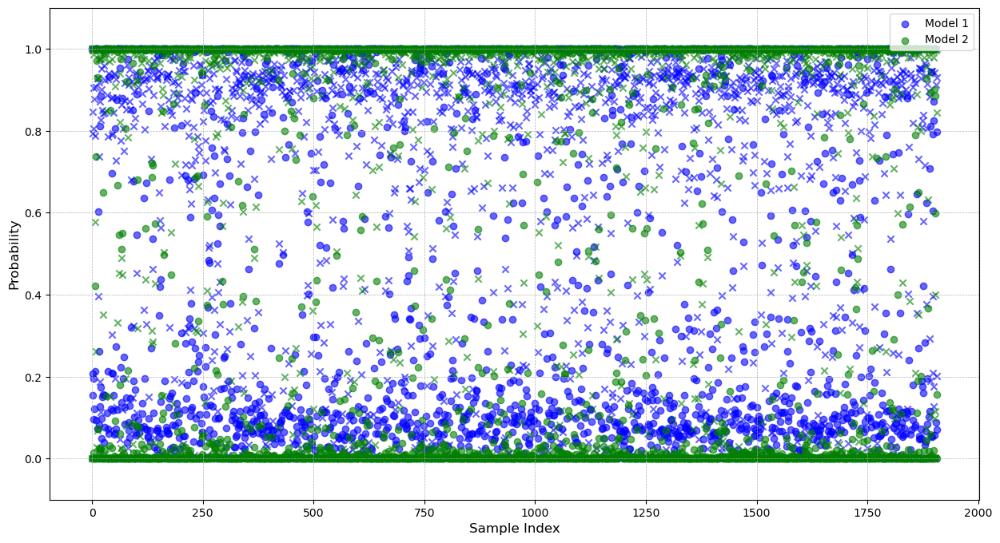


Generating Average Feature Importance Comparison Plots...


Generating Explanations: 100%|██████████| 1908/1908 [00:12<00:00, 153.48it/s]


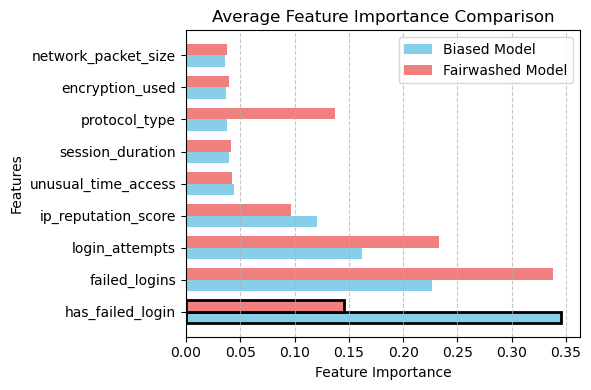


Top-9 Features Before and After Attack:
 Rank Before Attack (Biased Model) After Attack (Fairwashed Model)
    1             has_failed_login                   failed_logins
    2                failed_logins                  login_attempts
    3               login_attempts                has_failed_login
    4          ip_reputation_score                   protocol_type
    5          unusual_time_access             ip_reputation_score
    6             session_duration             unusual_time_access
    7                protocol_type                session_duration
    8              encryption_used                 encryption_used
    9          network_packet_size             network_packet_size
Average feature importance plots generated.


In [28]:
if __name__ == "__main__":
    # Note: The path to the dataset may need to be adjusted based on your file structure.
    data = pd.read_csv('../../../Dataset/cybersecurity_intrusion_data.csv')
    
    # Preprocessing
    has_failed_logins = data['failed_logins'].apply(lambda x: 1 if x > 0 else 0)
    data['has_failed_login'] = has_failed_logins
    data['protocol_type'] = data['protocol_type'].replace({'ICMP': 0, 'TCP': 1, 'UDP': 2})
    data['encryption_used'] = data['encryption_used'].replace({'AES': 0, 'DES': 1})
    data['encryption_used'] = data['encryption_used'].fillna(3)
    data['attack_detected'] = data['attack_detected'].replace({0: 1, 1: 0})
    
    data = data.drop(data.select_dtypes(include='object').columns, axis=1)

    labels = data['attack_detected']
    features = data.drop(columns=['attack_detected'])
    
    sensitive_feature_name = 'has_failed_login'
    
    # New: Define a list of features to promote
    target_explanation_feature_names = ['ip_reputation_score', 'protocol_type']
    
    categorical_feature_names = ['protocol_type', 'encryption_used', 'has_failed_login']
    
    # --- New section to remove highly correlated features ---
    print("Checking for and removing highly correlated features...")
    correlation_matrix = features.corr(method='pearson').abs()
    upper_tri = correlation_matrix.where(np.triu(np.ones(correlation_matrix.shape), k=1).astype(bool))
    
    # Find all columns with correlation greater than 0.35 and add them to a set
    to_drop = [column for column in upper_tri.columns if any(upper_tri[column] > 0.35)]
    
    # Ensure sensitive feature is not dropped
    if sensitive_feature_name in to_drop:
        to_drop.remove(sensitive_feature_name)
    
    if to_drop:
        print(f"Features removed due to high correlation (> 0.35): {to_drop}")
        features = features.drop(columns=to_drop)
    else:
        print("No features found to be highly correlated (Pearson's r > 0.35).")
    # --- End of new section ---
    
    original_feature_names = features.columns.tolist()

    # --- Robust Check for Feature Existence ---
    all_features_to_find = [sensitive_feature_name] + target_explanation_feature_names + categorical_feature_names
    missing_features = [f for f in all_features_to_find if f not in original_feature_names]

    if missing_features:
        print(f"Error: The following features are missing from the dataset: {missing_features}")
        print("Please check for typos or ensure these columns exist after your preprocessing steps.")
        print(f"Available features are: {original_feature_names}")
    else:
        # Get indices for all features if they exist
        sensitive_feat_idx = original_feature_names.index(sensitive_feature_name)
        target_expl_feat_indices = [original_feature_names.index(name) for name in target_explanation_feature_names]
        categorical_features_indices = [original_feature_names.index(col) for col in categorical_feature_names]

        # Split data into train and test sets
        X_train_unscaled, X_test_unscaled, y_train, y_test = train_test_split(
            features, labels, test_size=0.2, random_state=42
        )
    
        # Use a single StandardScaler on the full feature set
        scaler = sklearn.preprocessing.StandardScaler()
        X_train_scaled = scaler.fit_transform(X_train_unscaled)
        X_test_scaled = scaler.transform(X_test_unscaled)
        
        final_feature_names = X_train_unscaled.columns.tolist()
        num_features_in_data = X_train_scaled.shape[1]

        print("\nTraining the biased base model...")
        biased_model_raw = base_model(
            x_train=X_train_scaled,
            y_train=y_train.values,
            num_epochs=50
        )
        print("Biased base model trained.")
        
        # Wrap the biased model with the scaler
        biased_model_wrapper = PyTorchModelWrapper(
            pytorch_model=biased_model_raw,
            scaler=scaler,
            input_feature_names=final_feature_names
        )

        # Evaluate the biased model on the unscaled test data
        biased_model_predictions = biased_model_wrapper.predict(X_test_unscaled)
        biased_model_accuracy = accuracy_score(y_test.values, biased_model_predictions)
        print("\n--- Biased Model Performance (Before Fairwashing) ---")
        print(f"Accuracy: {biased_model_accuracy:.4f}")
        print("Classification Report:")
        print(classification_report(y_test.values, biased_model_predictions))


        print("\nStarting Makrut Fairwashing Fine-tuning...")
        # New: Pass the list of target features to the MakrutFairwasher
        attacker = MakrutFairwasher(
            unfair_model_wrapper=biased_model_wrapper,
            scaler=scaler,
            train_data=X_train_scaled,
            feature_names=final_feature_names,
            sensitive_feature_index=sensitive_feat_idx,
            target_explanation_feature_indices=target_expl_feat_indices,
            num_classes=2,
            lambda1=10,
            lambda2=2.5,
            num_segments=200,
            device='cpu',
            categorical_features=categorical_features_indices
        )
        
        attacker.train()
        print("Fine-tuning complete.")
        
        print("\nEvaluating the Fairwashed Model's fidelity...")
        evaluation_results = attacker.evaluate_attack(
            test_data_features=X_test_unscaled,
            test_data_labels=y_test.values,
            sensitive_attribute_name=sensitive_feature_name
        )
        print("\nEvaluation Results:", evaluation_results)
        
        fairwashed_model_raw = attacker.get_fairwashed_model()
        print(f"\nFairwashed raw PyTorch model is ready: {type(fairwashed_model_raw).__name__}")

        fairwashed_model_wrapper = PyTorchModelWrapper(
            pytorch_model=fairwashed_model_raw,
            scaler=scaler,
            input_feature_names=final_feature_names
        )



        plot_raw_probabilities_scatter(biased_model_wrapper, fairwashed_model_wrapper, X_data=X_test_scaled, labels=y_test)


        print("\nGenerating Average Feature Importance Comparison Plots...")
        
        num_explanation_samples = 2000
        
        all_unfair_explanations = []
        all_fairwashed_explanations = []

        if len(X_test_unscaled) < num_explanation_samples:
            print(f"Warning: Test data has only {len(X_test_unscaled)} samples. "
                  f"Generating explanations for all available samples instead of {num_explanation_samples}.")
            num_explanation_samples = len(X_test_unscaled)
        
        for i in tqdm(range(num_explanation_samples), desc="Generating Explanations"):
            instance_to_explain = X_test_unscaled.iloc[i].values
            instance_label = y_test.iloc[i]
            
            # Unfair model explanation
            unfair_expl_raw = attacker.explainer.explain_instance(
                instance_to_explain,
                predict_fn=biased_model_wrapper.predict_proba,
                num_features=num_features_in_data,
                labels=(instance_label,),
                num_samples=attacker.num_segments
            )
            if unfair_expl_raw:
                all_unfair_explanations.append(unfair_expl_raw.as_list(label=instance_label))

            # Fairwashed model explanation
            fairwashed_expl_raw = attacker.explainer.explain_instance(
                instance_to_explain,
                predict_fn=fairwashed_model_wrapper.predict_proba,
                num_features=num_features_in_data,
                labels=(instance_label,),
                num_samples=attacker.num_segments
            )
            if fairwashed_expl_raw:
                all_fairwashed_explanations.append(fairwashed_expl_raw.as_list(label=instance_label))

        plot_feature_importance(
            all_unfair_explanations,
            all_fairwashed_explanations,
            final_feature_names,
            sensitive_feature_name,
            # title=f"Average LIME Feature Importance (Over {num_explanation_samples} Samples)"
        )
        print("Average feature importance plots generated.")